In [181]:
import numpy as np
import os
from random import shuffle
import re
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
% matplotlib inline

In [182]:
import urllib.request
import zipfile
import lxml.etree


In [183]:
# Download the dataset if it's not already there: this may take a minute as it is 75MB
if not os.path.isfile('ted_en-20160408.zip'):
    urllib.request.urlretrieve("https://wit3.fbk.eu/get.php?path=XML_releases/xml/ted_en-20160408.zip&filename=ted_en-20160408.zip",
                               filename="ted_en-20160408.zip")
# For now, we're only interested in the subtitle text, so let's extract that from the XML:
with zipfile.ZipFile('ted_en-20160408.zip', 'r') as z:
    doc = lxml.etree.parse(z.open('ted_en-20160408.xml', 'r'))
input_text = doc.xpath('//content/text()')
tags = doc.xpath('//keywords/text()')

input_text_noparens = [re.sub(r'\([^)]*\)', '', text) 
                       for text in input_text]

texts = [re.sub(r"[^a-z0-9]+", " ", text.lower()) 
         for text in input_text_noparens]


We prepare a number of datasets:

**1. GloVe embeddings**
<br>
After the pre-processing steps, we generate train, val and tests sets after shuffling the data. We also generate a vocabulary using only words in the training set that occur at least 10 times. We then download GloVe vectors and generate an embedding matrix consisting of just the words from the vocabulary. We add an additional random vector for words that do not appear in the vocabulary. We then convert all the data into padded sequences of ids, where the id is the row index in the embedding matrix.

As the embeddings have to be trainable the bag-of-means is generated within the training graph. We will also use the id sequences with randomly initialised embeddings. The total number of words in the vocabulary is slightly higher than the number of words in the in both the training data and the glove dataset. However as the difference is small, we will use this number as the vocabulary size for the randomly initialised embeddings also. 

In [10]:
tokenized = [text.split(" ") for text in texts]
shuffle = np.random.permutation(np.arange(len(tokenized)))

shuffled_texts = []
for i in shuffle:
    shuffled_texts.append(tokenized[i])
    
train = shuffled_texts[:-500]
val = shuffled_texts[-500:-250]
test = shuffled_texts[-250:]

all_words = [word for text in train for word in text]
from collections import Counter
word_count = Counter(all_words)
vocab = set([word for word in all_words if word_count[word] >= 10])
len(vocab)

In [11]:
import pandas as pd
import csv #https://stackoverflow.com/questions/18016037/pandas-parsererror-eof-character-when-reading-multiple-csv-files-to-hdf5
glove = pd.read_csv('glove.6B/glove.6B.50d.txt',sep=' ',quoting=csv.QUOTE_NONE,
                   index_col=0,header=None)


In [13]:
from collections import defaultdict

train_words_in_glove = list(set(glove.index).intersection(vocab))
print(len(train_words_in_glove))

word2id = defaultdict(int)
word2id.update(dict(zip(train_words_in_glove,range(1,len(train_words_in_glove)+1))))
print(train_words_in_glove[:10])
glove.loc[train_words_in_glove][:10]

In [88]:
train_ids,val_ids,test_ids = [[[word2id[word] for word in text] for text in data]
                              for data in [train,val,test]]

In [89]:
def make_padded(ids):
    padded = np.zeros((len(ids), max(map(len,ids))),dtype=np.int32)
    for i,id_ in enumerate(ids):
        padded[i,:len(id_)] = id_
    return padded            

In [90]:
pad_train,pad_val,pad_test = [make_padded(data) for data in [train_ids,val_ids,test_ids]]
pad_train

In [92]:
embed_matrix = glove.loc[train_words_in_glove].values
print(embed_matrix.shape)
embed_matrix = np.concatenate((np.random.normal(size=(1,50)),embed_matrix))
embed_matrix[word2id['matched']]-glove.loc['matched'].values

(12504, 50)

Labels

Each document should be labeled with label from the set: {Too, oEo, ooD, TEo, ToD, oED, TED, ooo}. You are called to generate labels from the <keywords> tag by checking the existence of one of the following tags: {Technology, Entertainment, Design}.

- None of the keywords → ooo
- “Technology” → Too
- “Entertainment” → oEo
- “Design” → ooD
- “Technology” and “Entertainment” → TEo
- “Technology” and “Design” → ToD
- “Entertainment” and “Design” → oED
- “Technology” and “Entertainment” and “Design” → TED

**2. Pre-calculate bag-of-means**
For both GloVe and word2vec we generate bag-of-means features for each document.

In [184]:
texts

['here are two reasons companies fail they only do more of the same or they only do what s new to me the real real solution to quality growth is figuring out the balance between two activities exploration and exploitation both are necessary but it can be too much of a good thing consider facit i m actually old enough to remember them facit was a fantastic company they were born deep in the swedish forest and they made the best mechanical calculators in the world everybody used them and what did facit do when the electronic calculator came along they continued doing exactly the same in six months they went from maximum revenue and they were gone gone to me the irony about the facit story is hearing about the facit engineers who had bought cheap small electronic calculators in japan that they used to double check their calculators facit did too much exploitation but exploration can go wild too a few years back i worked closely alongside a european biotech company let s call them oncosear

In [ ]:
from gensim.models import Word2Vec

model_ted = Word2Vec(sentences_ted,min_count=10)

bom_train,bom_val,bom_test\
= [
    np.array([np.mean(get_embeddings(text),axis=0) for text in data])
  for data in [train,val,test]
  ]

In [54]:
import itertools

def make_label(comb):
    return ''.join([let if num else 'o' for (let,num) in zip('TED',comb)])

all_labels = [make_label(comb) for comb in itertools.product(*[[0,1]]*3)]

label_dict = dict(zip(all_labels ,range(8)))


In [98]:
from sklearn.preprocessing import OneHotEncoder

tags = [tags_i.lower() for tags_i in tags]
labels = [make_label([tags_i.find(tag) >-1 for tag in ['technology','entertainment','design']]) 
          for tags_i in tags]

num_labels = np.array(list(map(label_dict.get,labels)))

enc = OneHotEncoder()
onehot_labels = enc.fit_transform(np.reshape(num_labels,(-1,1))).toarray()

shuffled_labels = onehot_labels[shuffle,:]

# y_train,y_val,y_test = [shuffled_labels[ind:inds[i+1],:] 
#                         for i,ind in enumerate(inds[:-1])]

y_train = shuffled_labels[:-500]
y_val = shuffled_labels[-500:-250]
y_test = shuffled_labels[-250:]

We can see that most of the documents seem to belong to class 0. Looking for these tags might not be the best way to go about this task. The reason is that documents might have similar but not identical keywords. A better strategy might be to use word vectors for technology, entertainment and design and to find tags which are close.

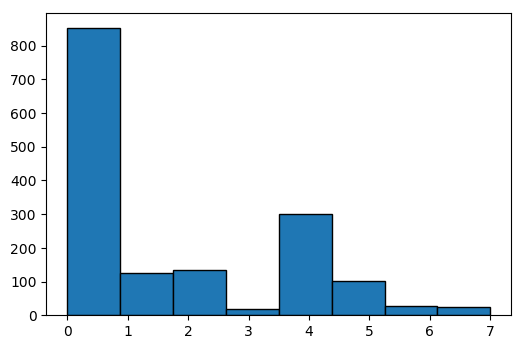

In [99]:
plt.hist(np.argmax(y_train,axis=1),bins=8,ec='k');

In [100]:
import tensorflow as tf
import math

In [172]:
class TextClassifier():

    def __init__(self,  
                embed_dim,
                hid_dims,
                num_classes,
                vocab_size=None,
                nonlin=tf.tanh,
                embed_matrix = None,
                dropout=False,
                optimizer=tf.train.AdamOptimizer(5e-4)):
        self.embed_dim = embed_dim
        self.hid_dims = hid_dims
        self.num_classes = num_classes
        self.nonlin = nonlin
        self.optimizer = optimizer
        self.vocab_size = vocab_size
        self.embed_matrix = np.float32(embed_matrix) if embed_matrix is not None else None
        self.dropout = dropout
        
    def build_graph(self):
        if 'sess' in globals() and sess:
            sess.close()
        tf.reset_default_graph()
        is_train = tf.placeholder(tf.bool)
        
        if self.vocab_size is not None:
            x = tf.placeholder(tf.int32,[None,None])
            if self.embed_matrix is not None:
                embed_matrix = tf.Variable(self.embed_matrix,name='embeddings')
            else:
                embed_matrix = tf.get_variable('embeddings',
                                               [self.vocab_size,self.embed_dim],
                                              dtype=tf.float32)
            embeds = tf.nn.embedding_lookup(embed_matrix,x)
            inputs = tf.reduce_mean(embeds,axis=1)
        else:
            x = tf.placeholder(tf.float32,[None,self.embed_dim])
            inputs = x
            
        y = tf.placeholder(tf.int32,[None,self.num_classes])
        
        dims = [self.embed_dim]+self.hid_dims+[self.num_classes]
        
        h = inputs
        for i,dim in enumerate(dims[1:]):
            W = tf.get_variable("W%i"%i, shape=[dims[i],dim])
            b = tf.get_variable("b%i"%i, shape=[dim])
            if(i < len(dims)-2):
                h = self.nonlin(tf.nn.xw_plus_b(h,W,b))
                if self.dropout:
                    dropout_rate = tf.placeholder('dropout_rate',tf.float32)
                    h = tf.nn.dropout(merged,dropout_rate)
                    self.dropout_rate = dropout_rate
                
        preds = tf.nn.xw_plus_b(h,W,b)
        correct_prediction = tf.equal(tf.argmax(y, 1), tf.argmax(preds, 1))
        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        loss = tf.reduce_mean(
          tf.nn.softmax_cross_entropy_with_logits(labels=y, logits=preds))

        train_step = self.optimizer.minimize(loss)
        
        self.x = x
        self.y = y
        self.loss = loss
        self.preds = preds
        self.train_step = train_step
        self.is_train = is_train
        self.accuracy = accuracy
        
    
    def test(self,data):
        x_test,y_test = data
        with tf.Session() as sess:
            saver = tf.train.Saver()
            saver.restore(sess,'./')
            feed = {self.is_train: False,
                    self.x: x_test,
                    self.y: y_test}
            acc = sess.run([self.accuracy], feed_dict=feed)
        return acc
    
    def get_preds(self,data):
        x_test,y_test = data
        with tf.Session() as sess:
            saver = tf.train.Saver()
            saver.restore(sess,'./')
            feed = {self.is_train: False,
                    self.x: x_test,
                    self.y: y_test}
            preds = sess.run([self.preds], feed_dict=feed)
        return np.argmax(preds[0],axis=1)
        
    def train(self,
                    data,
                    dropout_rate=0.6,
                    verbose=False,
                    batch_size = 50,
                    num_epochs = 100, 
                    skip_step=10):

        (x_train,y_train),(x_test,y_test) = [data['train'],data['test']]
        
        
        with tf.Session() as sess:
            
            sess.run(tf.global_variables_initializer())

            self.tr_accs, self.te_accs = [], []
            self.tr_losses, self.te_losses = [], []

            train_size = x_train.shape[0]

            for epoch in range(num_epochs):
                shuffle = np.random.permutation(np.arange(train_size))
                x_train = x_train[shuffle,:]
                y_train = y_train[shuffle,:]

                accuracy = 0
                losses = []

                for i in range(math.ceil(train_size/batch_size)):
                    ix = slice(i*50,(i+1)*50)
                    feed = {self.is_train: True,
                        self.x: x_train[ix,:],
                        self.y: y_train[ix,:]}
                    
                    if self.dropout:
                        feed[self.dropout_rate]=dropout_rate
                        
                    acc,_,loss = sess.run([self.accuracy,
                                          self.train_step,
                                          self.loss], 
                                          feed_dict=feed)

                    actual_batch_size = x_train[ix,:].shape[0]
                    losses.append(loss*actual_batch_size)
                    accuracy += acc*actual_batch_size

                feed = {self.is_train: False,
                        self.x: x_test,
                        self.y: y_test}
                
                if self.dropout:
                    feed[self.dropout_rate]=1.0

                val_acc,val_loss = sess.run([self.accuracy,self.loss], feed_dict=feed)
                
                
                total_tr_acc = accuracy/x_train.shape[0]
                total_tr_loss = np.sum(losses)/x_train.shape[0]
                if(verbose):
                    print("Epoch {2}, Overall training loss = {0:.3g} and accuracy of {1:.3g}"\
                      .format(total_tr_loss,total_tr_acc,epoch+1))
                    print("Epoch {2}, Overall validation loss = {0:.3g} and accuracy of {1:.3g}"\
                      .format(val_loss,val_acc,epoch+1))

                for val,lst in zip((total_tr_loss,val_loss,total_tr_acc,val_acc),
                                   (self.tr_losses,self.te_losses,self.tr_accs,self.te_accs)):
                    lst.append(val)
            
            saver = tf.train.Saver()
            saver.save(sess,'./')

    def plot(self):
            for i,j in zip(('Train Loss','Val Loss','Train Acc','Val Acc'),
                        [ self.tr_losses, self.te_losses, self.tr_accs, self.te_accs]):
                print(i,j[-1])
            plt.figure(figsize=(16,8))
            plt.subplot(1,2,1)
            plt.plot(self.tr_losses,label='train')
            plt.plot(self.te_losses,label='valid')
            plt.title('Loss per epoch')
            plt.legend()
            plt.subplot(1,2,2)
            plt.plot(self.tr_accs,label='train')
            plt.plot(self.te_accs,label='valid')
            plt.title('Accuracy per epoch')
            plt.legend()

    def train_and_plot(self,
                    data,
                    verbose=False,
                    batch_size = 50,
                    num_epochs = 100, 
                    skip_step=10):
        self.train(data)
        self.plot()


Trained embeddings initialized with GloVe

Train Loss 0.72040044152
Val Loss 1.14177
Train Acc 0.760883279403
Val Acc 0.572


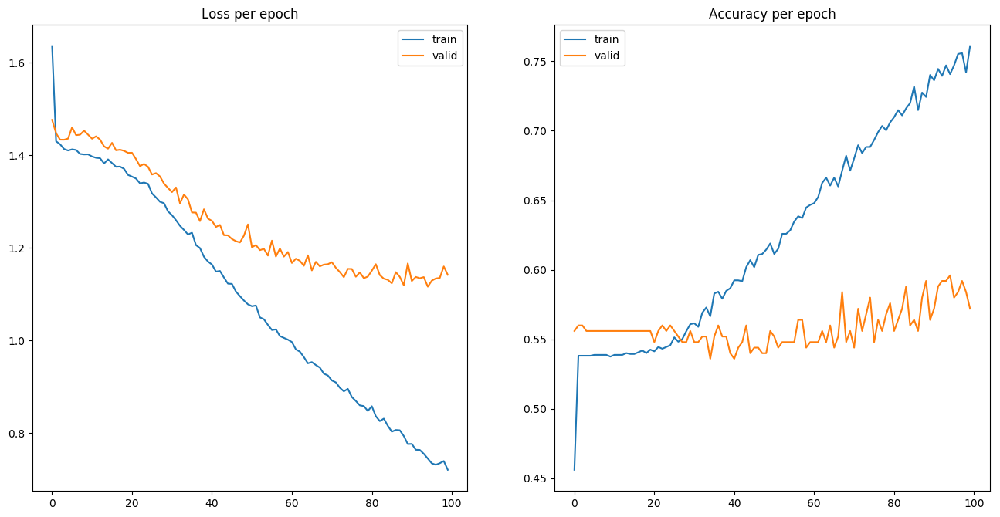

In [178]:
clf = TextClassifier(50,[250],8,len(word2id),embed_matrix=embed_matrix)
clf.build_graph()
clf.train_and_plot({'train':(pad_train,y_train),'test':(pad_val,y_val)},num_epochs=5000)

In [179]:
#Trained embeddings randomly initialized

Train Loss 0.522088780576
Val Loss 1.21555
Train Acc 0.837223967543
Val Acc 0.588


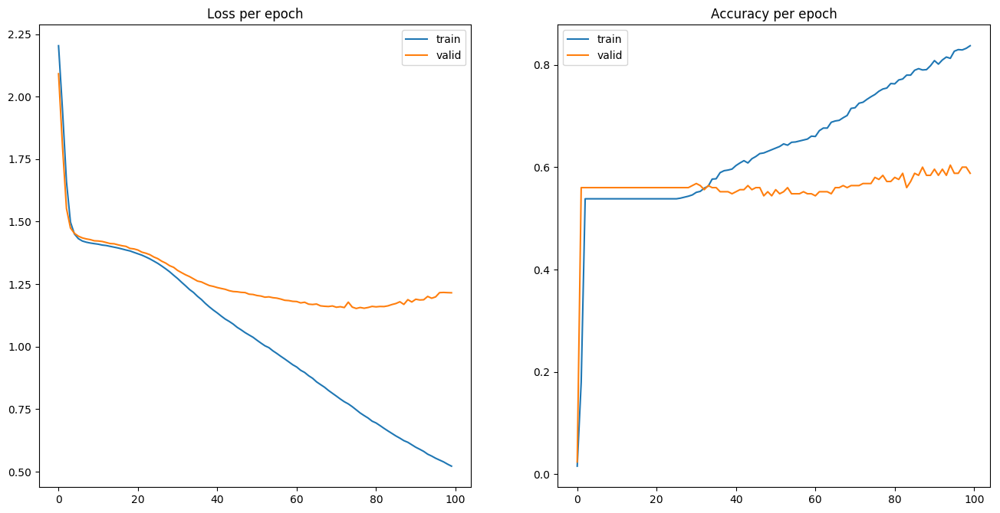

In [180]:
clf6 = TextClassifier(embed_dim=50,hid_dims=[50],num_classes=8,vocab_size=len(vocab)+1)
clf6.build_graph()
clf6.train_and_plot({'train':(pad_train,y_train),'test':(pad_val,y_val)},num_epochs=5000)

Train Loss 1.24501258718
Val Loss 1.23458
Train Acc 0.559621455918
Val Acc 0.552


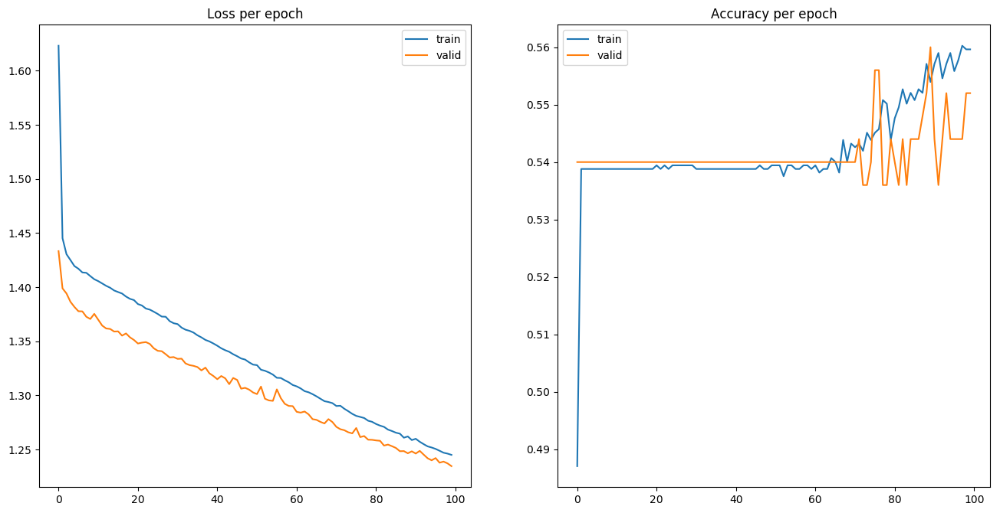

In [95]:
clf7 = TextClassifier(embed_dim=50,hid_dims=[250],
                      num_classes=8,nonlin=tf.tanh,
                     optimizer=tf.train.GradientDescentOptimizer(1e-2))
clf7.build_graph()
clf7.train_and_plot({'train':(bom_train,y_train),'test':(bom_val,y_val)},num_epochs=5000)

In [672]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [690]:
from sklearn.manifold import TSNE
label_words = list(set([t for tag in tags for t in tag.split(', ')]))
tags_vecs = get_embeddings(label_words)


tsne = TSNE(n_components=2, random_state=0)
tags_2d = tsne.fit_transform(tags_vecs)

In [692]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="word2vec T-SNE for most common words")

source = ColumnDataSource(data=dict(x1=tags_2d[:,0],
                                    x2=tags_2d[:,1],
                                    names=label_words))

p.scatter(x="x1", y="x2", size=8, source=source)

labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(labels)

show(p)